# Primeros Pasos con Vertex AI Gemini API & Python SDK

## Visión General

### Gemini

Gemini es una familia de modelos generativos de IA desarrollados por Google DeepMind y proyectados para casos de uso multimodales. La API Gemini da acceso a los modelos Gemini Pro y Gemini Pro Vision

### API Vertex AI Gemini

La API Vertex AI Gemini nos da una interfaz unificada para interactuar con modelos Gemini. Actualmente existen dos modelos disponibles en la API Gemini:

- **Modelo Gemini Pro** (`gemini-pro`): Diseñado para realizar tareas de lenguaje natural, chats multiturno de texto y código y generación de código.
- **Modelo Gemini Pro Vision** (`gemini-pro-vision`): Soporta prompts multimodales. Puedes incluir texto, imágenes y video en las entradas y obtener respuestas en texto o código.

Puedes interactuar con la API Gemini usando los siguientes métodos:

- Usando [Vertex AI Studio](https://cloud.google.com/generative-ai-studio) para pruebas rápidas y generación de comandos.
- Usando el SDK de Vertex AI

Esta libreta se concentra en el uso de **Vertex AI SDK para Python** para utilizar la API Vertex AI de Gemini.

Para obtener más información, consulta la documentación [IA Generativa en Vertex AI](https://cloud.google.com/vertex-ai/docs/generative-ai/learn/overview).

### Objetivos

En este tutorial, aprenderás cómo usar la API Vertex AI Gemini con el SDK Vertex AI para Python para interactuar con los modelos Gemini Pro (`gemini-pro`) y Gemini Pro Vision (`gemini-pro-vision`).

Concluirás las siguientes tareas:

- Instalar el SDK de Vertex AI para Python
- Usar la API Vertex AI Gemini para interactuar con cada modelo
  - Modelo Gemini Pro (`gemini-pro`):
    - Genera textos a partir de prompts de texto.
    - Explora varios recursos y opciones de configuración.
  - Modelo Gemini Pro Vision (`gemini-pro-vision`):
    - Genera texto a partir de imágenes y prompts de texto.
    - Genera texto a partir de prompts de video y texto.

### Costos

Este tutorial usa los siguientes componentes de Google Cloud que pueden generar costos en su factura:

- Vertex AI

Para mayores detalles, puedes revisar los [precios de Vertex AI](https://cloud.google.com/vertex-ai/pricing) y usar la [calculadora de precios](https://cloud.google.com/products/calculator) para generar una estimación de costos con base en el uso del proyecto.

## Primeros pasos

### Instala el SDK de Vertex AI

Este paso instala las librerias de Vertex AI necesarias para poder trabajar. Sólo es necesario instalarlas una vez, por lo que si ya lo realizaste con anterioridad, puedes omitir este paso.

In [ ]:
! pip3 install --upgrade google-cloud-aiplatform pillow

### **Sólo para uso en Colab - Autentica tu ambiente de trabajo**

En el caso que estés ejecutando esta libreta en un Google Colab, descomenta la siguiente celda para realizar la autenticación de la sesión en la libreta con Google Cloud. Este paso es importante **para la utilización en Colab**, así podemos garantizar que las llamadas a las APIs de Google Cloud funcionen sin problemas.

In [ ]:
"""
import sys
# Autenticacion adicional se necesita en Google Colab
if "google.colab" in sys.modules:
    # Autentica el usuario con Google Cloud
    from google.colab import auth

    auth.authenticate_user()
"""

### **Sólo para uso en Colab - define el proyecto en Google Cloud a utilizar**

En el caso que estés ejecutando esta libreta en Google Colab, descomenta la siguiente celda para definir qué proyecto en Google Cloud será usado por Colab en la ejecución de esta libreta. De lo contrario, continua con los siguientes pasos.

In [ ]:
"""
if "google.colab" in sys.modules:
    # Define la información del proyecto
    PROJECT_ID = "your-project-id" # @param {type:"string"}
    LOCATION = "us-central1" # @param {type:"string"}

    # Inicializa Vertex AI
    import vertexai

    vertexai.init(project=PROJECT_ID, location=LOCATION)
"""

### **Sólo para uso en entorno de desarrollo local - configurar las credenciales de aplicación por defecto (ADC)**

En el caso que estés ejecutando esta libreta en un entorno de desarrollo local, necesitarás configurar las credenciales de aplicaciones por defecto (ADC). ADC es una estrategia usada por las librerías de Google para automáticamente encontrar credenciales de acceso basadas en el entorno de la aplicación. Para ello, sigue los siguientes pasos:

- [Instala y configura la herramienta gcloud CLI](https://cloud.google.com/sdk/docs/install)
- Crea el archivo de credenciales


In [ ]:
#! gcloud auth application-default login

Al ejecutar este comando, aparecerá una pantalla de inició de sesión. Una vez que accedas, tus credenciales estarán almacenadas en el archivo de credenciales usado por ADC.

Para más información, consulta la guía para [Configurar Credenciales de Aplicación por Defecto](https://cloud.google.com/docs/authentication/provide-credentials-adc)

### Importa las biblotecas necesarias

In [3]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

import warnings
warnings.simplefilter('ignore', UserWarning)

from vertexai.generative_models import (
  GenerationConfig,
  GenerativeModel,
  Image,
  Part
)

## Importa el modelo `Gemini 1.0 Pro`

Gemini Pro (`gemini-1.0-pro`) ayuda en la realización de tareas utilizando lenguaje natural, chats multiturno de texto y código, y generación de código.

In [4]:
model = GenerativeModel('gemini-1.0-pro')

### Genera textos a partir de _prompts_ o entradas de texto

Envía un _prompt_ o entrada de texto para el modelo. El modelo Gemini Pro (`gemini-pro`) ofrece un mecanismo de respuesta en streaming. De esta manera, no necesitamos esperar por la respuesta completa, puedes comenzar a procesar fragmentos tan pronto como estén disponibles.

In [ ]:
# Prueba con tu propio prompt!
prompt = "¿Qué es el teorema de Bayes?"

# El parámetro stream nos permite usar la respuesta tan 
# pronto como esté disponible, en lugar de esperar a que
# se genere toda la respuesta.
respuesta = model.generate_content(prompt, stream=True)

for fragmento in respuesta:
  print(fragmento.text, end="")

### Parámetros del modelo

Cada prompt enviado al modelo incluye valores y parámetros que controlan cómo el modelo genera respuestas. El modelo puede generar resultados diferentes para valores de parámetros distintos. Puedes probar diferentes parámetros del modelo para ver cómo los resultados cambian.

In [6]:
config = GenerationConfig(
  temperature=0.9, # Rango [0.0 - 1.0]
  top_p=1.0, # Rango [0.1 - 1.0]
  top_k=32, # Rango [1 - 40]
  max_output_tokens=8192 # Rango [1 - 8192]
)

prompt = """
Por favor, explica para qué sirve cada uno de los siguientes
parámetros en los modelos de Gemini Pro:

- temperature
- top_p
- top_k
- max_output_tokens
"""

respuesta = model.generate_content(
  prompt, 
  generation_config=config,
  stream=True
)

for fragmento in respuesta:
  print(fragmento.text, end="")


## Parámetros en los modelos de Gemini Pro:

### Temperatura (temperature):

La temperatura controla la aleatoriedad de la salida del modelo. Un valor bajo (cercano a 0) produce una salida más predecible y similar a la del entrenamiento, mientras que un valor alto (cercano a 1) genera una salida más creativa e impredecible.

### Top_p (top p):

Top_p controla la diversidad de la salida del modelo. Un valor bajo (cercano a 0) selecciona solo las palabras con mayor probabilidad, mientras que un valor alto (cercano a 1) selecciona un rango más amplio de palabras, incluyendo algunas con menor probabilidad.

### Top_k (top k):

Top_k controla el número de palabras posibles que el modelo considera para generar la siguiente palabra. Un valor bajo (por ejemplo, 10) limita el espacio de búsqueda, mientras que un valor alto (por ejemplo, 50) amplía las posibilidades.

### Max_output_tokens (max output tokens):

Este parámetro controla el número máximo de tokens que el modelo puede generar en una

### Probemos los prompts de chat

El modelo Gemini Pro ofrece soporte a chats con varios turnos y es ideal para tareas de texto que exigen interacciones de ida y vuelta. Los siguientes ejemplos muestran cómo el modelo responde durante una conversación multiturno.

In [7]:
chat = model.start_chat()

# Prueba con tu propio prompt!
prompt = """
Mi nombre es Jose. Tú eres mi asistente personal.

Mis juegos favoritos son The Elder Scrolls IV: Oblivion, Grand Theft Auto: San Andreas y The Legend of Zelda: Breath of the Wild.

Sugiéreme otros juegos que podrían gustarme.
"""

respuesta = chat.send_message(prompt, stream=True)

for fragmento in respuesta:
  print(fragmento.text, end="")


* **The Elder Scrolls V: Skyrim:** Un juego de rol de mundo abierto aclamado por la crítica que se desarrolla 200 años después de los eventos de Oblivion. Cuenta con una historia épica, un vasto mundo para explorar y un sistema de personajes personalizable.

* **The Witcher 3: Wild Hunt:** Una aventura de rol de mundo abierto basada en la serie de libros de fantasía épica del mismo nombre. Ofrece una historia convincente, personajes memorables y un sistema de combate desafiante.

* **Red Dead Redemption 2:** Un juego de acción occidental de mundo abierto que sigue la historia de un forajido en el corazón de Estados Unidos. Cuenta con una historia épica, un mundo detallado y un sistema de juego inmersivo.

* **Grand Theft Auto V:** Un juego de acción y aventura de mundo abierto que se desarrolla en la ciudad ficticia de Los Santos. Ofrece una variedad de misiones, personajes únicos y un sistema de juego en línea expansivo.

* **The Legend of Zelda: Tears of the Kingdom:** La última entr

Este prompt de seguimiento muestra cómo el modelo responde con base en el prompt anterior

In [ ]:
# Prueba con tu propio prompt!
prompt = "¿Qué tienen estos juegos con los títulos que me gustan?"

respuesta = chat.send_message(prompt, stream=True)

for fragmento in respuesta:
  print(fragmento.text, end="")
  

También puedes tener acceso al historial del chat

In [ ]:
print(chat.history)

## Importa el modelo Gemini 1.0 Pro Vision

Gemini Pro Vision (`gemini-pro-vision`) es un modelo que soporta prompts multimodales. Puedes incluir texto, imágenes y videos en la entrada y obtener respuestas en texto o código.

In [8]:
multi_model = GenerativeModel('gemini-1.0-pro-vision')

### Define algunas funciones auxiliares

Estas funciones **no** son necesarias para trabajar con Gemini Pro Vision. Las utilizamos para poder visualizar las imágenes y videos que mandamos como prompt al modelo aquí en la libreta de Python.

In [9]:
import http.client
import typing
import urllib.request

import IPython.display
from PIL import Image as PIL_Image
from PIL import ImageOps as PIL_ImageOps

def display_images(
    images: typing.Iterable[Image],
    max_width: int = 600,
    max_height: int = 350
) -> None:
  for image in images:
    pil_image = typing.cast(PIL_Image.Image, image._pil_image)

    if pil_image.mode != 'RGB':
      # RGB es soportado por todos los entornos Jupyter
      pil_image = pil_image.convert('RGB')

    image_width, image_height = pil_image.size

    if max_width < image_width or max_height < image_height:
      # Redimensiona para mostrar una imagen más pequeña
      pil_image = PIL_ImageOps.contain(pil_image, (max_width, max_height))

    IPython.display.display(pil_image)

def get_image_bytes_from_url(image_url: str) -> bytes:
  with urllib.request.urlopen(image_url) as response:
    response = typing.cast(http.client.HTTPResponse, response)
    image_bytes = response.read()

  return image_bytes

def load_image_from_url(image_url: str) -> Image:
  image_bytes = get_image_bytes_from_url(image_url)

  return Image.from_bytes(image_bytes)

def get_url_from_gcs(gcs_uri: str) -> str:
  # Transforma URI de GCS (Google Content Storage)
  # a URL para mostrar las imágenes
  resource = gcs_uri.replace('gs://', '').replace(' ', '%20')
  url = f'https://storage.googleapis.com/{resource}'

  return url

def print_multimodal_prompt(contents: list) -> None:
  for content in contents:
    if isinstance(content, Image):
      display_images([ content ])
    elif isinstance(content, Part):
      url = get_url_from_gcs(content.file_data.file_uri)
      IPython.display.display(load_image_from_url(url))
    else:
      print(content)



### Genera texto a partir de imágenes locales

Usa el método `Image.load_from_file` para cargar un archivo local como la imagen para la cual generamos texto.

---------- Prompt ----------


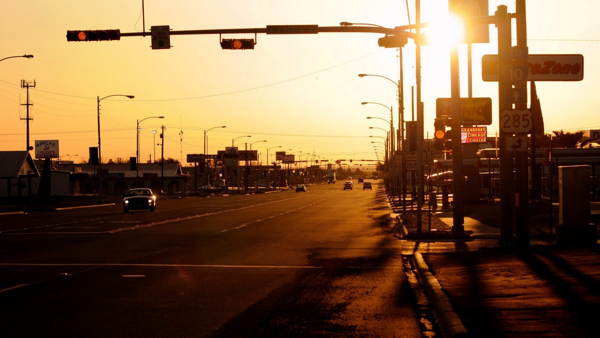

Describe esta imagen

---------- Respuesta ----------
 Esta imagen es de una calle en un pueblo pequeño. La calle está vacía, con solo unos pocos coches aparcados. Hay una gasolinera a la derecha y una tienda a la izquierda. El sol se está poniendo y el cielo está anaranjado.

In [11]:
# Opcional: Descarga una imagen desde Google Cloud Storage
# ! gsutil cp "gs://jcaguilar-dot-dev/street.jpg" ./image.jpg

# Carga una imagen desde un archivo local
image = Image.load_from_file('image.jpg')

# Prepara el contenido
prompt = "Describe esta imagen"
contenidos = [image, prompt]

respuesta = multi_model.generate_content(contenidos, stream=True)

print('---------- Prompt ----------')
print_multimodal_prompt(contenidos)

print('\n---------- Respuesta ----------')
for fragmento in respuesta:
  print(fragmento.text, end="")

### Generar texto a partir de texto e imágenes

#### Imágenes con URIs de Cloud Storage

Si tus imágenes están almacenadas en [Cloud Storage](https://cloud.google.com/storage/docs), puedes especificar la URI de Cloud Storage de la imagen para incluirlo en el prompt. También debes especificar el campo `mime-type`. Los tipos MIME soportados para imágenes incluyen `image/png` e `image/jpeg`.

Observe que la URI (no debe confundirse con la URL) de un objeto de Cloud Storage debe siempre comenzar con `gs://`.

---------- Prompt ----------


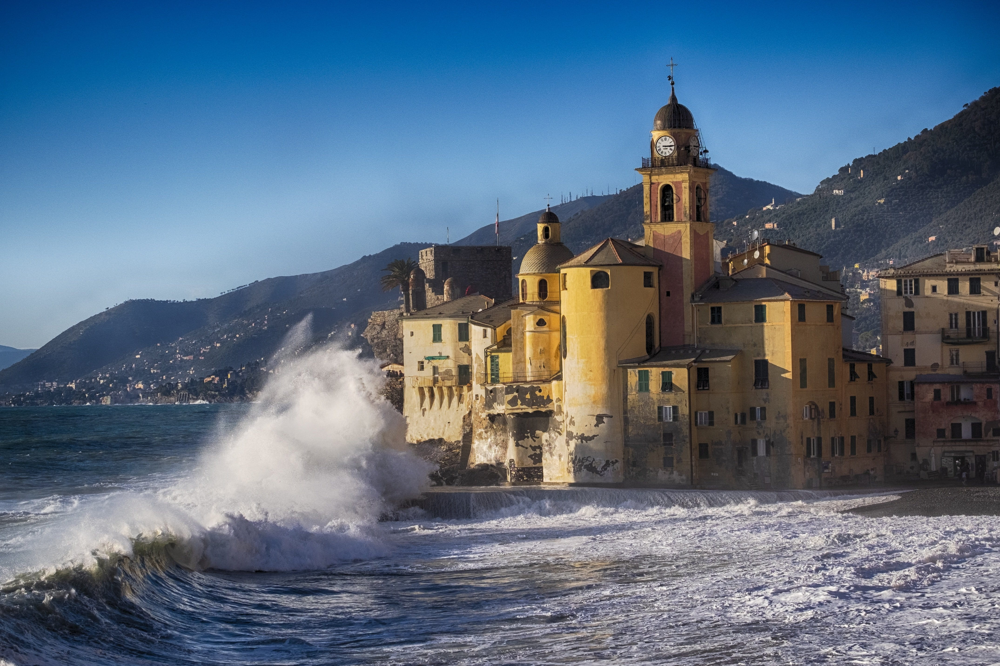

¿Puedes decirme en dónde fue tomada esta fotografía?

---------- Respuesta ----------
 Esta foto fue tomada en Italia, en la ciudad de Camogli.

In [17]:
# Carga una imagen desde una URI de Cloud Storage
gcs_uri = 'gs://jcaguilar-dot-dev/sea.jpg'

# Prepara el contenido
image = Part.from_uri(gcs_uri, mime_type='image/jpeg')
prompt = "¿Puedes decirme en dónde fue tomada esta fotografía?"
contenidos = [image, prompt]

config = GenerationConfig(
  temperature=0.1
)

respuesta = multi_model.generate_content(
  contenidos, 
  generation_config=config,
  stream=True
)

print('---------- Prompt ----------')
print_multimodal_prompt(contenidos)

print('\n---------- Respuesta ----------')
for fragmento in respuesta:
  print(fragmento.text, end="")

#### Imágenes con links directos

También puedes usar links directos para imágenes, conforme se muestra abajo. La función auxiliar `load_image_from_url()` (que fue declarada anteriormente) convierte la imagen en bytes y la retorna como un objeto Image que puede ser enviado a `Gemini Pro Vision` junto con el prompt de texto.

---------- Prompt ----------


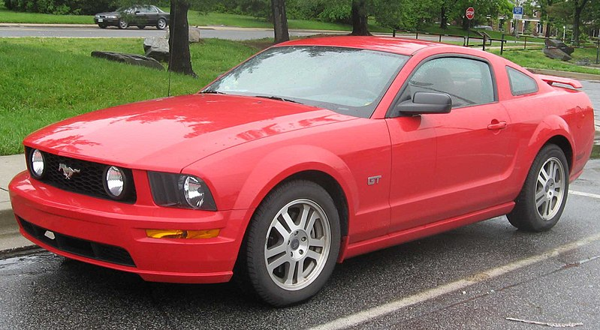

¿Puedes decirme el modelo exacto del vehículo que se muestra en esta fotografía?

---------- Respuesta ----------
 El vehículo mostrado en la fotografía es un Ford Mustang GT del año 2005.

In [23]:
# Carga una imagen (disponible públicamente en internet)
image_url = 'https://upload.wikimedia.org/wikipedia/commons/thumb/0/08/Ford_Mustang_GT_1.jpg/800px-Ford_Mustang_GT_1.jpg'

image = load_image_from_url(image_url) # Convierte la imagen a bytes

# Prepara el contenido
prompt = "¿Puedes decirme el modelo exacto del vehículo que se muestra en esta fotografía?"
contenidos = [image, prompt]

config = GenerationConfig(
  temperature=0.2,
  max_output_tokens=1000
)

respuesta = multi_model.generate_content(
  contenidos,
  generation_config=config,
  stream=True
)

print('---------- Prompt ----------')
print_multimodal_prompt(contenidos)

print('\n---------- Respuesta ----------')
for fragmento in respuesta:
  print(fragmento.text, end="")

#### Combinando varias imágenes y texto en un prompt *few-shot*

Puedes enviar más de una imagen por vez y colocarlos en cualquier lugar al lado de un prompt de texto.

En el ejemplo, la solicitud con algunas fotos es ejecutada para `Gemini Pro Vision` retorne la ciudad y los puntos de referencia en un formato JSON específico.

---------- Prompt ----------


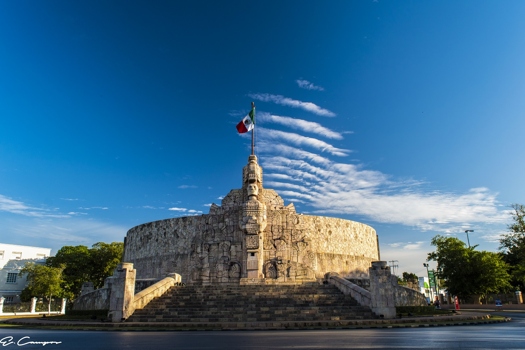

{"ciudad": "Mérida", "punto_turistico": "Paseo de Montejo"}


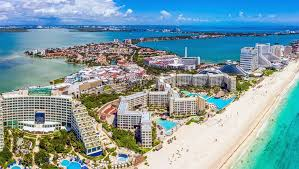

{"ciudad": "Cancún", "punto_turistico": "Zona Hotelera"}


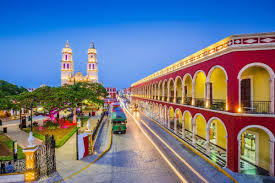


---------- Respuesta ----------
 {"ciudad": "Campeche", "punto_turistico": "Centro Histórico"}

In [24]:
# Carga imágenes desde Cloud Storage URI
image1_url = 'https://storage.googleapis.com/jcaguilar-dot-dev/ciudad1.jpg'
image2_url = 'https://storage.googleapis.com/jcaguilar-dot-dev/ciudad2.jpg'
image3_url = 'https://storage.googleapis.com/jcaguilar-dot-dev/ciudad3.jpg'

image1 = load_image_from_url(image1_url)
image2 = load_image_from_url(image2_url)
image3 = load_image_from_url(image3_url)

# Prepara el contenido
prompt1 = """{"ciudad": "Mérida", "punto_turistico": "Paseo de Montejo"}"""
prompt2 = """{"ciudad": "Cancún", "punto_turistico": "Zona Hotelera"}"""
contenidos = [ image1, prompt1, image2, prompt2, image3 ]

respuesta = multi_model.generate_content(contenidos, stream=True)

print('---------- Prompt ----------')
print_multimodal_prompt(contenidos)

print('\n---------- Respuesta ----------')
for fragmento in respuesta:
  print(fragmento.text, end="")

### Genera texto a partir de un archivo de video

Especifica la URI de Cloud Storage de un video que será incluido en el prompt. También debes especificar el campo `mime_type`. El tipo MIME soportado para videos incluye `video/mp4`.

In [29]:
file_path = "jcaguilar-dot-dev/found.mp4"
video_uri = f'gs://{file_path}'
video_url = f'https://storage.googleapis.com/{file_path}'

IPython.display.Video(video_url, width=450)

In [30]:
prompt = """
¿Puedes darme un resumen de lo que ocurre en el siguiente video?
"""

video = Part.from_uri(video_uri, mime_type='video/mp4')
contenidos = [prompt, video]

respuesta = multi_model.generate_content(contenidos, stream=True)

for fragmento in respuesta:
  print(fragmento.text, end="")


 Un hombre se encuentra un radio y reproduce una canción que le suena de algo. Entonces, va a una tienda de música y le pregunta al dependiente si sabe de qué canción se trata. El dependiente le dice que es una canción de los 80 y que es muy popular. El hombre se alegra mucho y se va a casa a escucharla.